# Decision Tree Regressor Air Quality Index Prediction


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')

<AxesSubplot:>

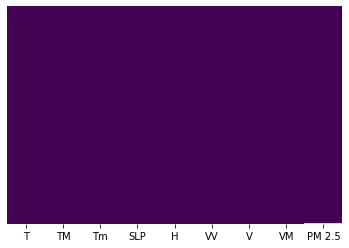

In [3]:
## Check for null values

sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [4]:
df=df.dropna()

In [5]:
X = df.iloc[:,:-1] # Independent features
y = df.iloc[:,-1]

In [6]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# ignore warnings
import warnings
warnings.filterwarnings("ignore")


In [7]:
X

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2
5,16.0,25.2,10.0,1013.2,79.0,0.6,4.8,11.1
6,13.4,21.0,9.2,1015.1,87.0,0.5,1.5,7.6
7,14.3,22.6,6.6,1016.3,76.0,0.8,0.4,3.5
8,12.7,18.9,7.3,1021.2,76.0,1.8,6.1,16.5
9,11.9,18.9,6.3,1020.1,76.0,1.1,8.3,20.6


In [8]:
y

0       219.720833
1       182.187500
2       154.037500
3       223.208333
4       200.645833
5       285.225000
6       236.825000
7       276.908333
8       108.000000
9       107.625000
10      125.891667
11      181.012500
12      152.554167
13      152.320833
14      319.737500
15      332.708333
16      279.600000
17      179.116667
18       54.791667
19       93.375000
20      103.000000
21      132.208333
22      127.708333
23      109.333333
24       56.458333
25      135.833333
26      122.500000
27       69.666667
28       79.833333
29       62.708333
30       21.208333
31        1.916667
32        1.833333
33      105.833333
34      117.583333
35      122.708333
36      111.958333
37       59.208333
38       77.208333
39       98.708333
40      123.708333
41       64.791667
42       52.333333
43       52.041667
44      128.333333
45        0.000000
46       23.208333
47       15.166667
48       21.250000
49       81.833333
50      105.333333
51      117.750000
52       84.

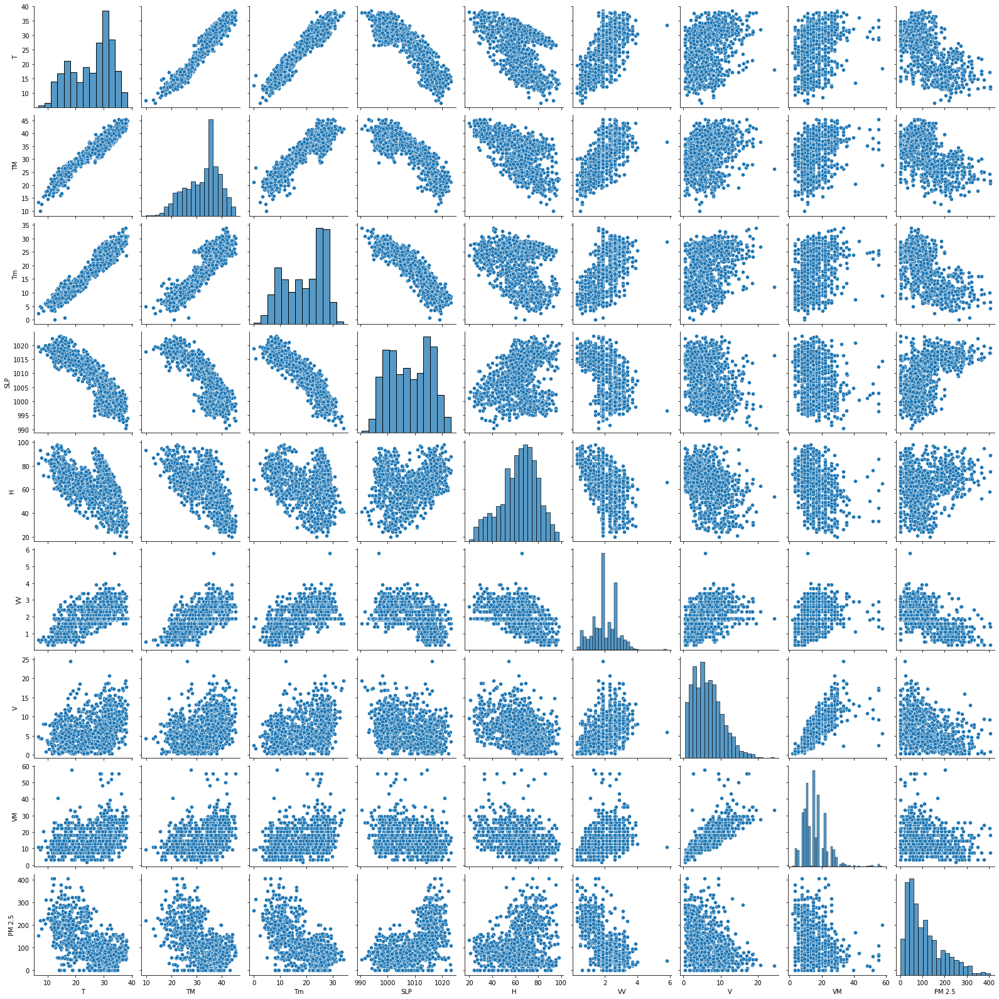

In [9]:
sns.pairplot(df)

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.963416,0.957227,-0.883207,-0.488919,0.625547,0.320218,0.276548,-0.629693
TM,0.963416,1.000000,0.889979,-0.826008,-0.576799,0.598727,0.303218,0.285671,-0.565459
Tm,0.957227,0.889979,1.000000,-0.912333,-0.275047,0.547490,0.312165,0.244408,-0.661733
SLP,-0.883207,-0.826008,-0.912333,1.000000,0.231971,-0.483494,-0.325862,-0.269129,0.605637
H,-0.488919,-0.576799,-0.275047,0.231971,1.000000,-0.489597,-0.356241,-0.368694,0.166577
VV,0.625547,0.598727,0.547490,-0.483494,-0.489597,1.000000,0.369851,0.325963,-0.593327
V,0.320218,0.303218,0.312165,-0.325862,-0.356241,0.369851,1.000000,0.780952,-0.327917
VM,0.276548,0.285671,0.244408,-0.269129,-0.368694,0.325963,0.780952,1.000000,-0.262848
PM 2.5,-0.629693,-0.565459,-0.661733,0.605637,0.166577,-0.593327,-0.327917,-0.262848,1.000000


#### Correlation matrix with heatmap

<AxesSubplot:>

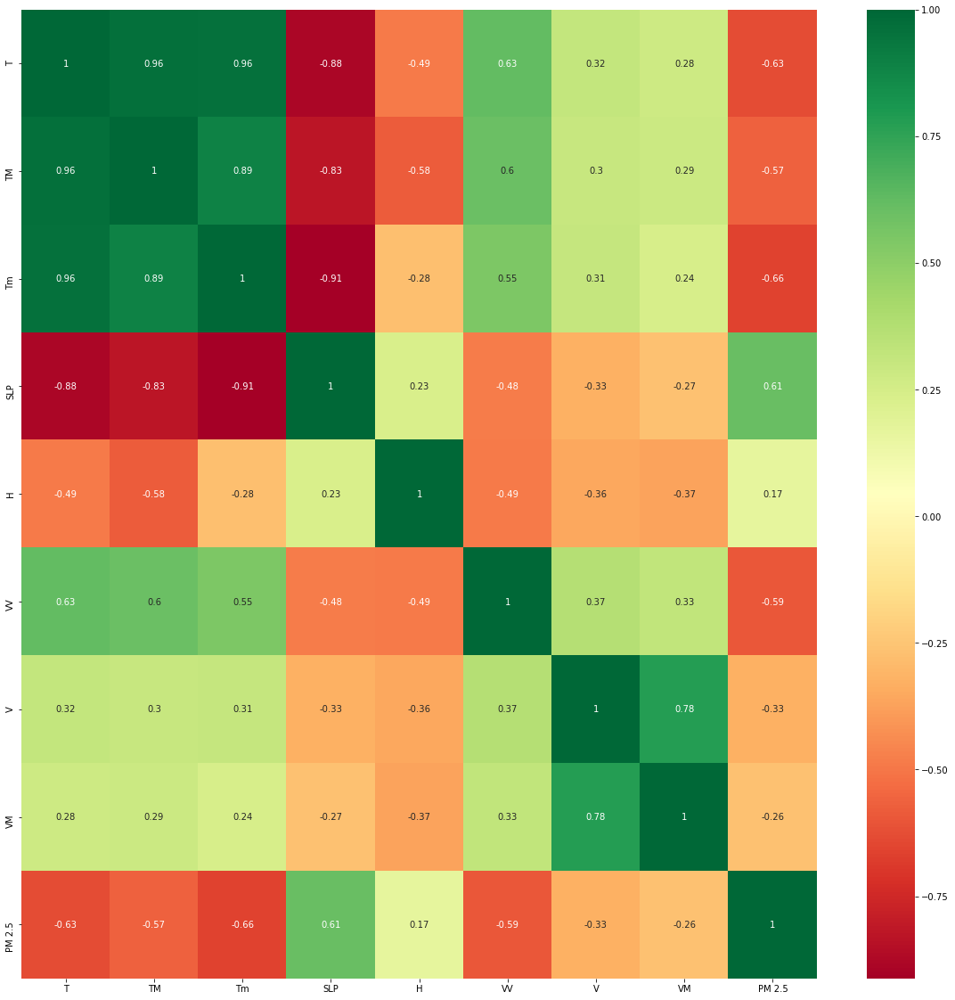

In [11]:
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [12]:
corrmat.index


Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### Feature Importance
You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [13]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [14]:
X.head()


,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [15]:
print(model.feature_importances_)


[0.18467949 0.10124757 0.19444849 0.12785213 0.07634173 0.2110146
 0.05943592 0.04498008]


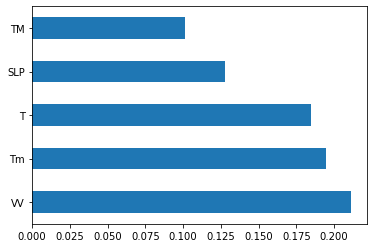

In [16]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

# Decision Tree Regressor

<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

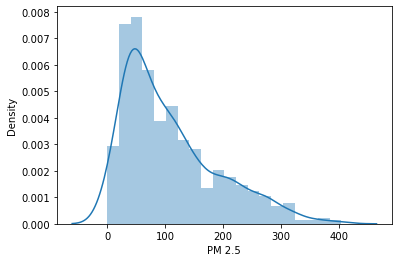

In [17]:
sns.distplot(y)


In [83]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)

In [84]:
from sklearn.tree import DecisionTreeRegressor

In [85]:
dtree = DecisionTreeRegressor(criterion='mse')
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [86]:

print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [87]:

print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: 0.34049647861406007


In [23]:
from sklearn.model_selection import cross_val_score

In [24]:
score = cross_val_score(dtree,X,y,cv=5)

In [25]:
score.mean()

0.08174938462113604

## Tree Visualization
Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library

In [28]:
!pip install pydotplus

     |████████████████████████████████| 278 kB 692 kB/s eta 0:00:01
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24567 sha256=8a09295bb6a55af9b7207dcbda80bae39818c6f2791e0c8d8495465b6587bfa5
  Stored in directory: /home/dhakad/.cache/pip/wheels/fe/cd/78/a7e873cc049759194f8271f780640cf96b35e5a48bef0e2f36
Successfully built pydotplus


In [33]:
!pip install graphviz

In [35]:
!pip install six

In [37]:
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [38]:
features = list(df.columns[:-1])     # convert independent features into list
features                 

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [39]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.831375 to fit



### Model Evaluation

In [88]:
prediction=dtree.predict(X_test)

<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

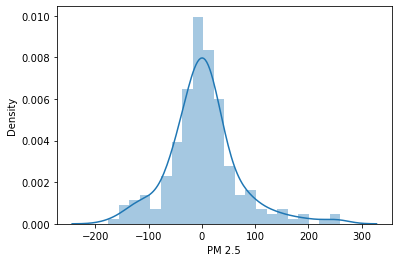

In [90]:
sns.distplot(y_test-prediction)

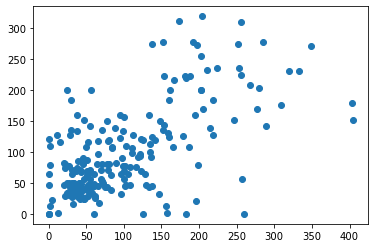

In [91]:
plt.scatter(y_test,prediction)

## Hyperparameter Tuning Decision Tree Regressor

In [92]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [95]:
## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [96]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [98]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [99]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [100]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 5400 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done 12568 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 21784 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 33048 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 46360 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 54264 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 55352 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 56568 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 57912 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 59384 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 82696 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  3.2min finished



 Time taken: 0 hours 3 minutes and 13.98 seconds.


In [102]:
random_search.best_params_

{'max_depth': 8,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_samples_leaf': 3,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [103]:
random_search.best_score_

-3316.3027477431124

In [104]:
predictions=random_search.predict(X_test)

<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

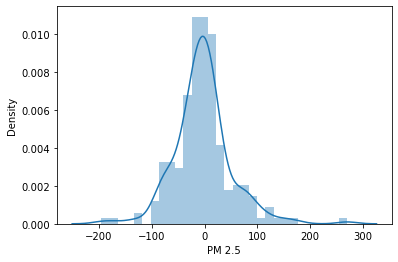

In [105]:
sns.distplot(y_test-predictions)

In [107]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 37.54821487079276
MSE: 2952.082694098879
RMSE: 54.33307182645648
